In [33]:
import numpy as np
import h5py
import os
import sys
import datetime
import csv
from torchvision import transforms as transforms
import matplotlib.pyplot as plt
import pickle

np.random.seed(0)

In [29]:
path = './data/'
f = h5py.File(path + 'child_mind_x_train_v2.mat', 'r')
x_train = f['X_train']
x_train = np.transpose(x_train,(0,2,1))
x_train = np.reshape(x_train,(-1,24*256))
print('X_train shape: ' + str(x_train.shape))
f = h5py.File(path + 'child_mind_y_train_v2.mat', 'r')
y_train = f['Y_train']
y_train = np.reshape(y_train, -1)

print('Y_train shape: ' + str(y_train.shape))

f = h5py.File(path + 'child_mind_x_val_v2.mat', 'r')
x_val = f['X_val']
x_val = np.transpose(x_val,(0,2,1))
x_val = np.reshape(x_val,(-1,24*256))
print('X_val shape: ' + str(x_val.shape))
f = h5py.File(path + 'child_mind_y_val_v2.mat', 'r')
y_val = f['Y_val']
y_val = np.reshape(y_val, -1)
print('Y_val shape: ' + str(y_val.shape))

f = h5py.File(path + 'child_mind_x_test_v2.mat', 'r')
x_test = f['X_test']
x_test = np.transpose(x_test,(0,2,1))
x_test = np.reshape(x_test,(-1,24*256))
print('X_test shape: ' + str(x_test.shape))
f = h5py.File(path + 'child_mind_y_test_v2.mat', 'r')
y_test = f['Y_test']
y_test = np.reshape(y_test, -1)
print('Y_test shape: ' + str(y_test.shape))

X_train shape: (71300, 6144)
Y_train shape: (71300,)
X_val shape: (39868, 6144)
Y_val shape: (39868,)
X_test shape: (16006, 6144)
Y_test shape: (16006,)


In [24]:
print(np.histogram(y_train))

(array([35626,     0,     0,     0,     0,     0,     0,     0,     0,
       35674]), array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]))


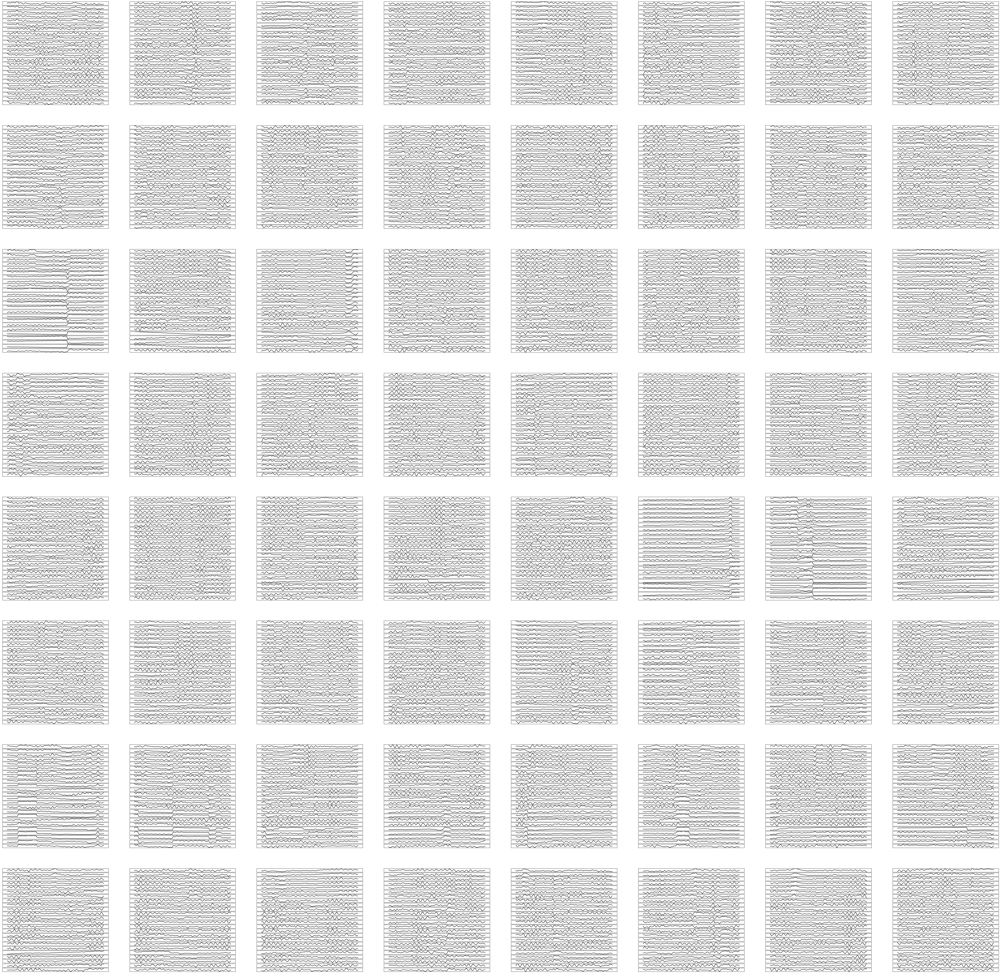

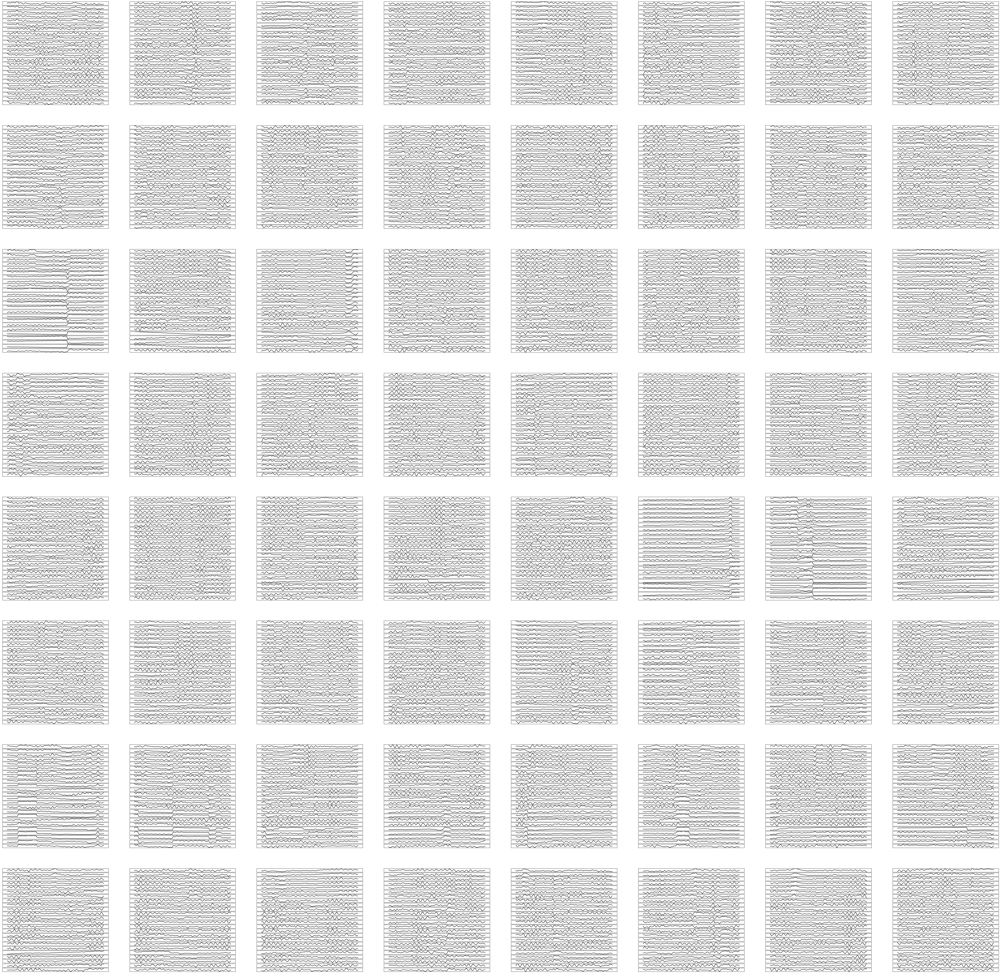

In [12]:
# visualize input
# visualize one batch of input
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
from PIL import Image

def plot_EEG(img, numChan, winLength, srate):      
    fig = plt.figure(figsize=(80, 80))
    outer = gridspec.GridSpec(8, 8)
    for i in range(64):
        inner = gridspec.GridSpecFromSubplotSpec(numChan, 1,
                        subplot_spec=outer[i])
#             npimg = img[i,:,:,:].numpy()
        npimg = img[i,:,:]
        npimg = np.reshape(npimg,(numChan,winLength*srate))
        yax = None
        for j in range(numChan):
            ax = plt.Subplot(fig, inner[j])
            ax.plot(range(winLength*srate),npimg[j,:],'k')
            ax.set_xticks([])
            ax.set_yticks([])
            fig.add_subplot(ax)

    return fig
plot_EEG(x_train, 24, 2, 128)

# Random forest

In [25]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier()
forest.fit(x_train, y_train)


RandomForestClassifier()

In [26]:
forest.score(x_train,y_train)

0.9990182328190743

In [27]:
forest.score(x_val,y_val)

0.7164141667502759

In [30]:
forest.score(x_test,y_test)

0.7162314132200425

In [34]:
pickle.dump(forest, open('random_forest.sav', 'wb'))

# Logistic Regression

In [35]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression() # lasso by default
logreg.fit(x_train, y_train)

/Users/dtyoung/miniconda3/envs/ml/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [36]:
logreg.score(x_train,y_train)

0.5224964936886396

In [37]:
logreg.score(x_val,y_val)

0.4951339420086285

In [38]:
logreg.score(x_test,y_test)

0.5015619142821442

In [39]:
pickle.dump(logreg, open('logistic_regression.sav', 'wb'))

# LDA

In [40]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis()
lda.fit(x_train, y_train)

LinearDiscriminantAnalysis()

In [41]:
lda.score(x_train,y_train)

0.5641514726507714

In [42]:
lda.score(x_val,y_val)

0.49944817899066923

In [43]:
lda.score(x_test,y_test)

0.5114956891165813

In [44]:
pickle.dump(lda, open('LDA.sav', 'wb'))

# SVM